# Analyzing Crime in Los Angeles

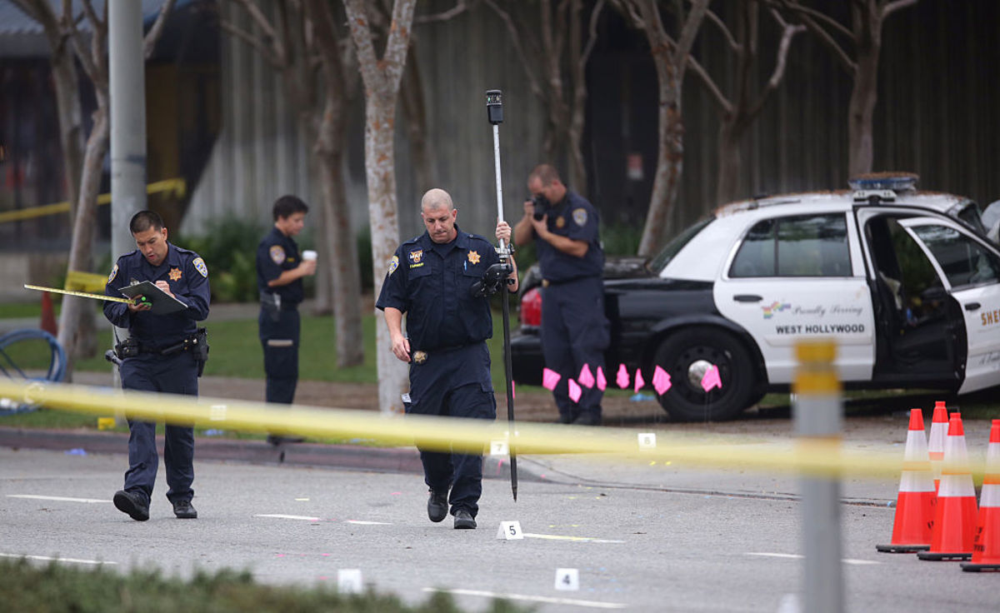

- Los Angeles, California 😎. The City of Angels. Tinseltown. The Entertainment Capital of the World!
- Known for its warm weather, palm trees, sprawling coastline, and Hollywood, along with producing some of the most iconic films and songs. However, as with any highly populated city, it isn't always glamorous and there can be a large volume of crime.
- You have been asked to support the Los Angeles Police Department (LAPD) by analyzing crime data to identify patterns in criminal behavior. They plan to use your insights to allocate resources effectively to tackle various crimes in different areas.

### - In this project, we have a dataset called crimes that's include : 
1. 'DR_NO' : Division of Records Number: Official file number made up of a 2-digit year, area ID, and 5 digits.
2. 'Date Rptd' : Date reported - MM/DD/YYYY.
3. 'DATE OCC' : Date of occurrence - MM/DD/YYYY.
4. 'TIME OCC' : In 24-hour military time.
5. 'AREA NAME' : The 21 Geographic Areas or Patrol Divisions are also given a name designation that references a landmark or the surrounding community that it is responsible for. For example, the 77th Street Division is located at the intersection of South Broadway and 77th Street, serving neighborhoods in South Los Angeles.
6. 'Crm Cd Desc' : Indicates the crime committed.
7. 'Vict Age' : Victim's age in years.
8. 'Vict Sex' : Victim's sex: F: Female, M: Male, X: Unknown.
9. 'Vict Descent' : Victim's descent: (A - Other Asian) , (B - Black) , ( C - Chinese ) , ( D - Cambodian ) ,  (F - Filipino ) , ( G - Guamanian ) , ( H - Hispanic/Latin/Mexican ) , ( I - American Indian/Alaskan Native ), ( J - Japanese ) , ( K - Korean ) , ( L - Laotian ) , ( O - Other ) , ( P - Pacific Islander ) , ( S - Samoan ) , ( U - Hawaiian ) , ( V - Vietnamese ) , ( W - White ) , ( X - Unknown ) , ( Z - Asian Indian ) 
10. 'Weapon Desc' : Description of the weapon used (if applicable).
11. 'Status Desc' : Crime status.
12. 'LOCATION' : Street address of the crime.



### - After exploring and cleaning our data a little, we're going to answer questions like:
1. Which hour has the highest frequency of crimes?
2. Which area has the largest frequency of night crimes (crimes committed between 10pm and 3:59am)?
3. Identify the number of crimes committed against victims by age group (<18, 18-25, 26-34, 35-44, 45-54, 55-64, 65+).
4. Which gender has the most victims over the time?
5. Which Nationality has the most victims?
6. The most gender has victims.
7. The most crimes committed.

## 1.  Import libraries and crimes dataset 

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import plotly.express as px

In [2]:
crimes = pd.read_csv(r"E:\courses\Data Analysis\Python\projects\4. Analyzing Crime in Los Angeles\crimes.csv")
display(crimes.head())

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA NAME,Crm Cd Desc,Vict Age,Vict Sex,Vict Descent,Weapon Desc,Status Desc,LOCATION
0,221412410,2022-06-15,2020-11-12,1700,Pacific,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),0,NaN,NaN,NaN,Invest Cont,13600 MARINA POINT DR
1,220314085,2022-07-22,2020-05-12,1110,Southwest,THEFT OF IDENTITY,27,F,B,NaN,Invest Cont,2500 S SYCAMORE AV
2,222013040,2022-08-06,2020-06-04,1620,Olympic,THEFT OF IDENTITY,60,M,H,NaN,Invest Cont,3300 SAN MARINO ST
3,220614831,2022-08-18,2020-08-17,1200,Hollywood,THEFT OF IDENTITY,28,M,H,NaN,Invest Cont,1900 TRANSIENT
4,231207725,2023-02-27,2020-01-27,635,77th Street,THEFT OF IDENTITY,37,M,H,NaN,Invest Cont,6200 4TH AV


## 2. Taking note of dataset issues 

In [3]:
print(crimes.describe())

              DR_NO       TIME OCC       Vict Age
count  2.479880e+05  247988.000000  247988.000000
mean   2.256571e+08    1317.184662      29.954764
std    5.042345e+06     655.090477      21.901016
min    2.203000e+03       1.000000      -2.000000
25%    2.210130e+08     845.000000       0.000000
50%    2.220131e+08    1400.000000      31.000000
75%    2.310058e+08    1843.000000      45.000000
max    2.399165e+08    2359.000000      99.000000


In [4]:
crimes.info()
print(crimes.isna().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 247988 entries, 0 to 247987
Data columns (total 12 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   DR_NO         247988 non-null  int64 
 1   Date Rptd     247988 non-null  object
 2   DATE OCC      247988 non-null  object
 3   TIME OCC      247988 non-null  int64 
 4   AREA NAME     247988 non-null  object
 5   Crm Cd Desc   247988 non-null  object
 6   Vict Age      247988 non-null  int64 
 7   Vict Sex      215740 non-null  object
 8   Vict Descent  215739 non-null  object
 9   Weapon Desc   80087 non-null   object
 10  Status Desc   247988 non-null  object
 11  LOCATION      247988 non-null  object
dtypes: int64(3), object(9)
memory usage: 22.7+ MB
DR_NO                0
Date Rptd            0
DATE OCC             0
TIME OCC             0
AREA NAME            0
Crm Cd Desc          0
Vict Age             0
Vict Sex         32248
Vict Descent     32249
Weapon Desc     167901
Status

- We noticed that the Date Rptd and DATE OCC columns are object data types , we should convert them to datetime.
- we found that TIME OCC column is referes to the time that the crime has commited and maximum of the digit of it is 4 numbers but there are rows contains 3 or less than 4 so we will complete these rows with 0 in the left and take the first two number as the hours in a new column.
- In the Vict Descent column, it contains of characters and each character referes to and nationality so we will make an new column and drop the Vict Descent column.
- In the Vict Sex column, it is the an object we should convert it to category because it consists of Male(M), Female(F) and Unknown (that we couldn't know the sex of the body)
- In the the Vict Age column we found that the min of this column is -2 and there is no age with minis so we will get rid of it.
- We will convert the Crm Cd Desc column to a suitable name crime committed.

## 3. Exploratory Data Analysis and Cleaning the data 

### Droping null values:

- First we make a threshold that's equal to 5% of the length of the total data 
- Then we compare the columns of the data with this threshold to know which columns has missing values smaller than the threshold and if it smaller we drop these rows ( dropna() ) and if it greater than the threshold we convert them with the any statistical operation like mean,median and mode.
- All of this we are applying on the numerical columns not the object or categories columns.

In [5]:
threshold = len(crimes) *0.05
print(threshold)

12399.400000000001


In [6]:
col_low_than_threshold = crimes.columns[crimes.isna().sum() <= threshold]
print(col_low_than_threshold)

Index(['DR_NO', 'Date Rptd', 'DATE OCC', 'TIME OCC', 'AREA NAME',
       'Crm Cd Desc', 'Vict Age', 'Status Desc', 'LOCATION'],
      dtype='object')


- we see that Vict Sex, Vict Descent and Weapon Desc columns are above the thresold and all the other columns aren't having any missing values.
- But the three columns not numerical columns so we can't make any statistical operation on it.

### Make the null values as Unknown in Weapon Desc column :

- So we can convert the missing values in these columns with Unknown that referes to we can't recognize the weapon that used.

In [7]:
# Replace null values in the 'Weapon Desc' column with 'Unknown'
crimes['Weapon Desc'] = crimes['Weapon Desc'].fillna('Unknown')

### Make the null values as Unknown in Vict Sex column and correct the data type :

- So we can convert the missing values in these columns with Unknown that referes to we can't recognize the sex of the victim. 
- And we found some rows with H or - values, maybe it's an error in entering the data and it's small number of rows so we will convert it as Unknown too.

In [8]:
crimes["Vict Sex"] = crimes["Vict Sex"].str.replace("H","X")
crimes["Vict Sex"] = crimes["Vict Sex"].str.replace("-","X")
crimes["Vict Sex"] = crimes["Vict Sex"].fillna("X")

- In this column we have 3 categorical Male, Female and Unkown.

In [9]:
crimes["Vict Sex"] = crimes["Vict Sex"].astype("category")
print(crimes["Vict Sex"].dtypes)

category


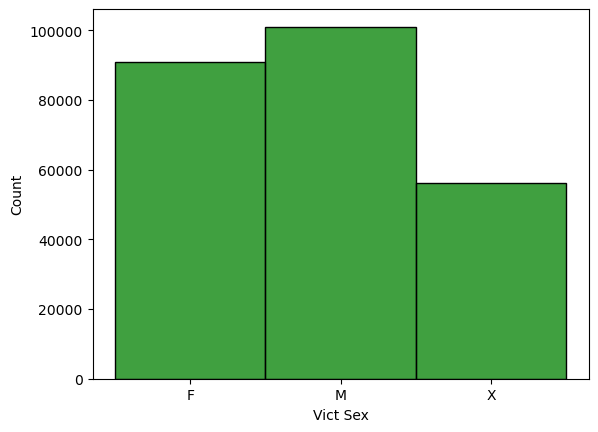

In [10]:
sns.histplot(data =crimes,x="Vict Sex",color="green")
plt.show()

In [11]:
print(crimes["Vict Sex"].value_counts())

M    101028
F     90804
X     56156
Name: Vict Sex, dtype: int64


### Creating a new column called victim nationality and drop the Vict Descent :

- We will make a new column called victim nationality instead of the Vict Descent column and we will drop it too.
- So we can convert the missing values in these columns with Unknown that referes to we can't recognize the nationality of the victim.

In [12]:
mapping = {
    'A': 'Other Asian','B': 'Black','C': 'Chinese','D': 'Cambodian','F': 'Filipino','G': 'Guamanian','H': 'Hispanic/Latin/Mexican','I': 'American Indian/Alaskan Native','J': 'Japanese','K': 'Korean','L': 'Laotian','O': 'Other','P': 'Pacific Islander','S': 'Samoan','U': 'Hawaiian','V': 'Vietnamese','W': 'White','X': 'Unknown','Z': 'Asian Indian'
          }

# Create the new column 'Victim Nationality'
crimes['Victim Nationality'] = crimes['Vict Descent'].replace(mapping)
crimes['Victim Nationality'] = crimes['Victim Nationality'].fillna("Unknown")
crimes['Victim Nationality'] = crimes['Victim Nationality'].str.replace("-","Unknown")

# Drop the 'Vict Descent' column
crimes = crimes.drop(columns=['Vict Descent'])
display(crimes.head())

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA NAME,Crm Cd Desc,Vict Age,Vict Sex,Weapon Desc,Status Desc,LOCATION,Victim Nationality
0,221412410,2022-06-15,2020-11-12,1700,Pacific,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),0,X,Unknown,Invest Cont,13600 MARINA POINT DR,Unknown
1,220314085,2022-07-22,2020-05-12,1110,Southwest,THEFT OF IDENTITY,27,F,Unknown,Invest Cont,2500 S SYCAMORE AV,Black
2,222013040,2022-08-06,2020-06-04,1620,Olympic,THEFT OF IDENTITY,60,M,Unknown,Invest Cont,3300 SAN MARINO ST,Hispanic/Latin/Mexican
3,220614831,2022-08-18,2020-08-17,1200,Hollywood,THEFT OF IDENTITY,28,M,Unknown,Invest Cont,1900 TRANSIENT,Hispanic/Latin/Mexican
4,231207725,2023-02-27,2020-01-27,635,77th Street,THEFT OF IDENTITY,37,M,Unknown,Invest Cont,6200 4TH AV,Hispanic/Latin/Mexican


### We will convert the Date Rptd and DATE OCC columns to datetime data type :

In [13]:
crimes["Date Rptd"] = pd.to_datetime(crimes["Date Rptd"])
crimes["DATE OCC"] = pd.to_datetime(crimes["DATE OCC"])
print(crimes["Date Rptd"].dtype)
print(crimes["DATE OCC"].dtype)

datetime64[ns]
datetime64[ns]


### Convert 'TIME OCC' to a string and add leading zeros :

In [14]:
# Convert 'TIME OCC' to a string and add leading zeros
crimes['TIME OCC'] = crimes['TIME OCC'].astype(str).str.zfill(4)
display(crimes.head())

,DR_NO,Date Rptd,DATE OCC,TIME OCC,AREA NAME,Crm Cd Desc,Vict Age,Vict Sex,Weapon Desc,Status Desc,LOCATION,Victim Nationality
0,221412410,2022-06-15,2020-11-12,1700,Pacific,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),0,X,Unknown,Invest Cont,13600 MARINA POINT DR,Unknown
1,220314085,2022-07-22,2020-05-12,1110,Southwest,THEFT OF IDENTITY,27,F,Unknown,Invest Cont,2500 S SYCAMORE AV,Black
2,222013040,2022-08-06,2020-06-04,1620,Olympic,THEFT OF IDENTITY,60,M,Unknown,Invest Cont,3300 SAN MARINO ST,Hispanic/Latin/Mexican
3,220614831,2022-08-18,2020-08-17,1200,Hollywood,THEFT OF IDENTITY,28,M,Unknown,Invest Cont,1900 TRANSIENT,Hispanic/Latin/Mexican
4,231207725,2023-02-27,2020-01-27,0635,77th Street,THEFT OF IDENTITY,37,M,Unknown,Invest Cont,6200 4TH AV,Hispanic/Latin/Mexican


### You can extract the hours from the relevant column "TIME OCC" and drop it  :

- We will extract the first two number of the TIME OCC column and put in a new column called HOUR OCC and drop the TIME OCC column.

In [15]:
# crimes["TIME OCC"] = crimes["TIME OCC"].astype(str)
crimes["HOUR OCC"] = crimes["TIME OCC"].str[:2].astype(int)
# crimes["TIME OCC"] = crimes["TIME OCC"].astype(int)
# print(crimes["TIME OCC"])
# display(crimes.head())

- We will drop the "TIME OCC" column :

In [16]:
crimes = crimes.drop(columns=['TIME OCC'])

In [17]:
# Convert 'HOUR OCC' to int64
crimes['HOUR OCC'] = crimes['HOUR OCC'].astype('int64')

### Dealing with the Vict Age column : 

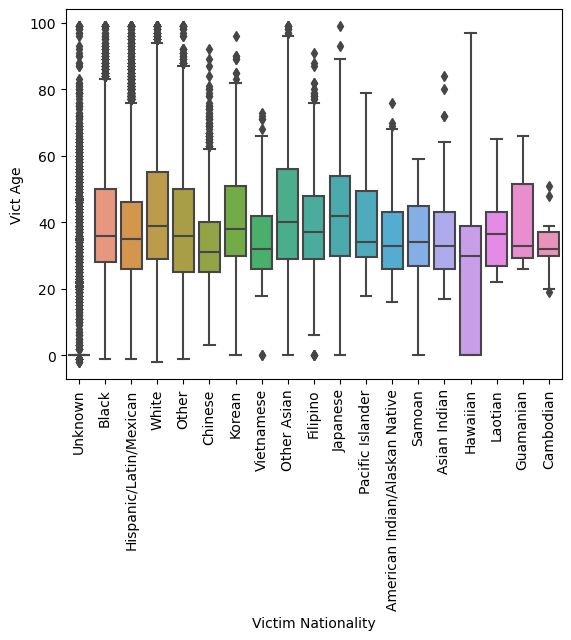

In [18]:
sns.boxplot(data=crimes,x="Victim Nationality",y= "Vict Age")
plt.xticks(rotation = 90 )
plt.show()

- 1. Replace Negative Values with NaN:


In [19]:
# crimes['Vict Age'] = np.where(crimes['Vict Age'] >= 0, crimes['Vict Age'], np.nan)
# print(crimes.describe())

- 2. Impute with Median or Mean: Replace negative values with the median or mean of the non-negative values in the column.

In [20]:
mean_age = crimes[crimes['Vict Age'] >= 0]['Vict Age'].mean()
crimes['Vict Age'] = np.where(crimes['Vict Age'] >= 0, crimes['Vict Age'], mean_age)
print(mean_age)

29.958911899336574


In [21]:
crimes["Vict Age"] =crimes["Vict Age"].astype('int64')
print(crimes.describe())

              DR_NO       Vict Age       HOUR OCC
count  2.479880e+05  247988.000000  247988.000000
mean   2.256571e+08      29.958784      12.990116
std    5.042345e+06      21.898067       6.548983
min    2.203000e+03       0.000000       0.000000
25%    2.210130e+08       0.000000       8.000000
50%    2.220131e+08      31.000000      14.000000
75%    2.310058e+08      45.000000      18.000000
max    2.399165e+08      99.000000      23.000000


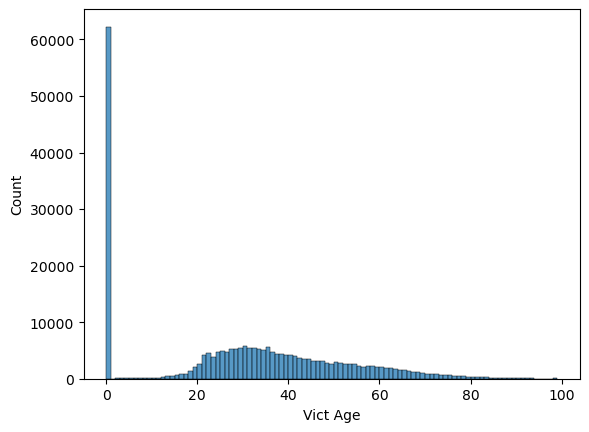

In [22]:
sns.histplot(data=crimes,x="Vict Age",bins=np.arange(0,100,1))
plt.show()

- I found that there is alot of victims with 0 years old so it's incorrect so we will convert it with the mean of the column.

In [23]:
# Calculate the mean of the 'Vict Age' column excluding values between 0 and 10
mean_age = crimes[(crimes['Vict Age'] > 10)]['Vict Age'].mean()

# Replace values in the 'Vict Age' column between 0 and 10 with the calculated mean
crimes['Vict Age'] = crimes['Vict Age'].apply(lambda x: mean_age if 0 <= x <= 10 else x)

# Now, when you check the summary statistics, you should see the updated values
print(crimes.describe())

              DR_NO       Vict Age       HOUR OCC
count  2.479880e+05  247988.000000  247988.000000
mean   2.256571e+08      40.108225      12.990116
std    5.042345e+06      13.266170       6.548983
min    2.203000e+03      11.000000       0.000000
25%    2.210130e+08      31.000000       8.000000
50%    2.220131e+08      40.108225      14.000000
75%    2.310058e+08      45.000000      18.000000
max    2.399165e+08      99.000000      23.000000


### Convert the Crm Cd Desc to a suitable name : 

In [24]:
# Use the rename method to rename the column
crimes.rename(columns={'Crm Cd Desc': 'Crime Committed'}, inplace=True)

display(crimes.head())

,DR_NO,Date Rptd,DATE OCC,AREA NAME,Crime Committed,Vict Age,Vict Sex,Weapon Desc,Status Desc,LOCATION,Victim Nationality,HOUR OCC
0,221412410,2022-06-15,2020-11-12,Pacific,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),40.108225,X,Unknown,Invest Cont,13600 MARINA POINT DR,Unknown,17
1,220314085,2022-07-22,2020-05-12,Southwest,THEFT OF IDENTITY,27.000000,F,Unknown,Invest Cont,2500 S SYCAMORE AV,Black,11
2,222013040,2022-08-06,2020-06-04,Olympic,THEFT OF IDENTITY,60.000000,M,Unknown,Invest Cont,3300 SAN MARINO ST,Hispanic/Latin/Mexican,16
3,220614831,2022-08-18,2020-08-17,Hollywood,THEFT OF IDENTITY,28.000000,M,Unknown,Invest Cont,1900 TRANSIENT,Hispanic/Latin/Mexican,12
4,231207725,2023-02-27,2020-01-27,77th Street,THEFT OF IDENTITY,37.000000,M,Unknown,Invest Cont,6200 4TH AV,Hispanic/Latin/Mexican,6


### create the heatmap :

C:\Users\Mostafa Zaglol\AppData\Local\Temp\ipykernel_22380\1710048717.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(crimes.corr(),annot = True)


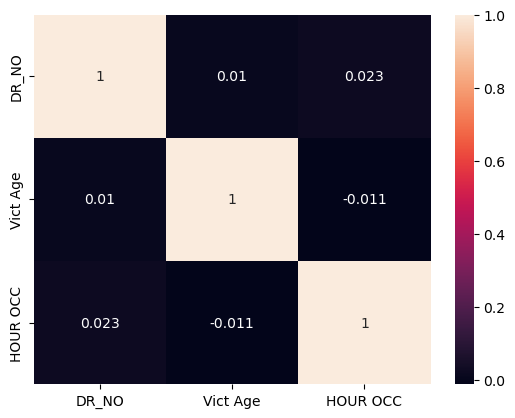

In [25]:
sns.heatmap(crimes.corr(),annot = True)
plt.show()

From the heatmap we found that there is not any relation between DR_NO, Vict Age and HOUR OCC columns 

### We look at the final detalis of the data :

In [26]:
display(crimes.head())
print(crimes.describe())
crimes.info()
print(crimes.isna().sum())

,DR_NO,Date Rptd,DATE OCC,AREA NAME,Crime Committed,Vict Age,Vict Sex,Weapon Desc,Status Desc,LOCATION,Victim Nationality,HOUR OCC
0,221412410,2022-06-15,2020-11-12,Pacific,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),40.108225,X,Unknown,Invest Cont,13600 MARINA POINT DR,Unknown,17
1,220314085,2022-07-22,2020-05-12,Southwest,THEFT OF IDENTITY,27.000000,F,Unknown,Invest Cont,2500 S SYCAMORE AV,Black,11
2,222013040,2022-08-06,2020-06-04,Olympic,THEFT OF IDENTITY,60.000000,M,Unknown,Invest Cont,3300 SAN MARINO ST,Hispanic/Latin/Mexican,16
3,220614831,2022-08-18,2020-08-17,Hollywood,THEFT OF IDENTITY,28.000000,M,Unknown,Invest Cont,1900 TRANSIENT,Hispanic/Latin/Mexican,12
4,231207725,2023-02-27,2020-01-27,77th Street,THEFT OF IDENTITY,37.000000,M,Unknown,Invest Cont,6200 4TH AV,Hispanic/Latin/Mexican,6


              DR_NO       Vict Age       HOUR OCC
count  2.479880e+05  247988.000000  247988.000000
mean   2.256571e+08      40.108225      12.990116
std    5.042345e+06      13.266170       6.548983
min    2.203000e+03      11.000000       0.000000
25%    2.210130e+08      31.000000       8.000000
50%    2.220131e+08      40.108225      14.000000
75%    2.310058e+08      45.000000      18.000000
max    2.399165e+08      99.000000      23.000000
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 247988 entries, 0 to 247987
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   DR_NO               247988 non-null  int64         
 1   Date Rptd           247988 non-null  datetime64[ns]
 2   DATE OCC            247988 non-null  datetime64[ns]
 3   AREA NAME           247988 non-null  object        
 4   Crime Committed     247988 non-null  object        
 5   Vict Age            247988 non-null

## Now : we clean our data and convert each column to the correct datatypes

In [27]:
print(crimes["AREA NAME"].value_counts()) 

Central        18732
77th Street    15408
Southwest      14194
Pacific        13866
Olympic        12792
Newton         12790
Hollywood      12761
Southeast      12600
Wilshire       12080
N Hollywood    11728
Rampart        11725
West LA        11169
West Valley    10766
Northeast      10686
Van Nuys       10640
Devonshire     10184
Topanga         9968
Harbor          9701
Mission         9175
Hollenbeck      9063
Foothill        7960
Name: AREA NAME, dtype: int64


## 4. Data visualization :

### 1. Which hour has the highest frequency of crimes :

- Finding the frequencies of crimes by the hour of occurrence.
- You can extract the hours from the relevant column, convert it to integer data type, and plot the frequencies.

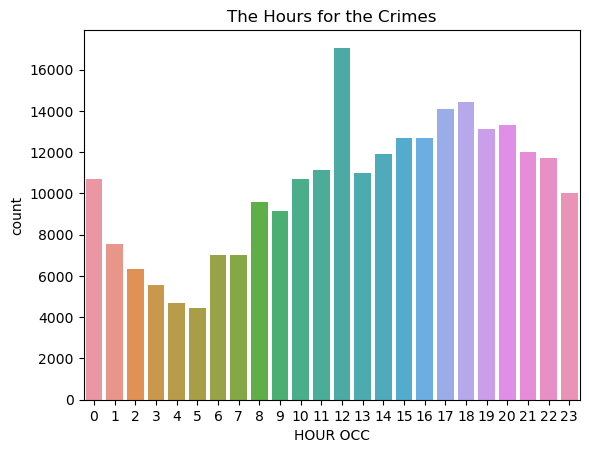

The Maximum crimes is 17065 and happened when the Hour is 12
The Minimum crimes is 4440 and happened when the Hour is 5


In [28]:
sns.countplot(data=crimes , x= "HOUR OCC")
# plt.xticks(rotation = 90)
plt.title("The Hours for the Crimes")
plt.show()

peak_crime_hour_amount = crimes["HOUR OCC"].value_counts().max()
peak_crime_hour = crimes["HOUR OCC"].value_counts().idxmax()

min_crime_hour_amount = crimes["HOUR OCC"].value_counts().min()
min_crime_hour = crimes["HOUR OCC"].value_counts().idxmin()

print(f"The Maximum crimes is {str(peak_crime_hour_amount)} and happened when the Hour is {str(peak_crime_hour)}")
print(f"The Minimum crimes is {str(min_crime_hour_amount)} and happened when the Hour is {str(min_crime_hour)}")

### 2. Identifying the area with the most night crime :

You'll need to filter the data for the relevant hours and count the number of crimes by area.

In [29]:
crimes_nights = crimes[crimes["HOUR OCC"].isin([22,23,0,1,2,3])]
night_time = crimes_nights
display(crimes_nights.head())

,DR_NO,Date Rptd,DATE OCC,AREA NAME,Crime Committed,Vict Age,Vict Sex,Weapon Desc,Status Desc,LOCATION,Victim Nationality,HOUR OCC
9,231207476,2023-02-27,2020-08-15,77th Street,BURGLARY,72.0,M,Unknown,Invest Cont,8800 HAAS AV,Black,0
12,221711184,2022-06-15,2020-05-15,Devonshire,THEFT OF IDENTITY,27.0,M,Unknown,Invest Cont,8300 WHITE OAK AV,Black,1
36,221314362,2022-07-11,2020-04-07,Newton,THEFT OF IDENTITY,53.0,F,Unknown,Invest Cont,1600 E OLYMPIC BL,Hispanic/Latin/Mexican,0
39,231307252,2023-03-03,2020-07-05,Newton,THEFT OF IDENTITY,22.0,F,Unknown,Invest Cont,6600 S BROADWAY,Black,23
42,221614254,2022-11-13,2020-01-01,Foothill,THEFT OF IDENTITY,22.0,F,Unknown,Invest Cont,10200 TELFAIR AV,Hispanic/Latin/Mexican,0


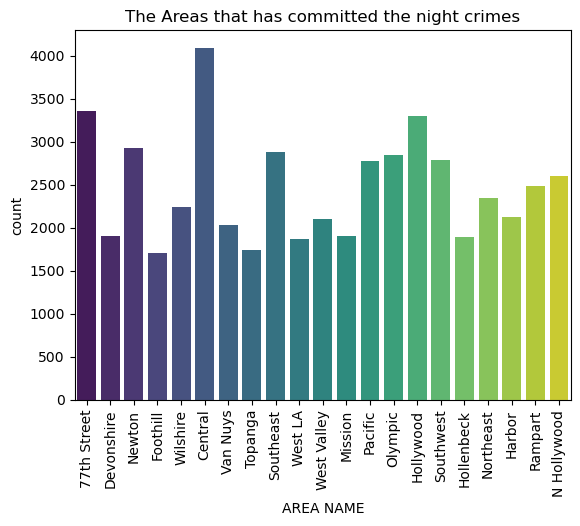

The Area that has committed the maximum night crimes is Central
The Area that has committed the minimum night crimes is Foothill


In [30]:
night_time_location =crimes_nights.groupby("AREA NAME")["HOUR OCC"].count()
# print(night_time_location)
sns.countplot(data=crimes_nights,x="AREA NAME", palette ="viridis")
peak_night_crime_location = crimes_nights["AREA NAME"].value_counts().idxmax()
min_night_crime_location = crimes_nights["AREA NAME"].value_counts().idxmin()

plt.xticks(rotation = 90)
plt.title("The Areas that has committed the night crimes")
plt.show()
print(f"The Area that has committed the maximum night crimes is {peak_night_crime_location}")
print(f"The Area that has committed the minimum night crimes is {min_night_crime_location}")

### 3. Crimes by age group :

Bin and label victim age into the provided groups, then produce a pandas Series detailing how many crimes were committed against each age group.

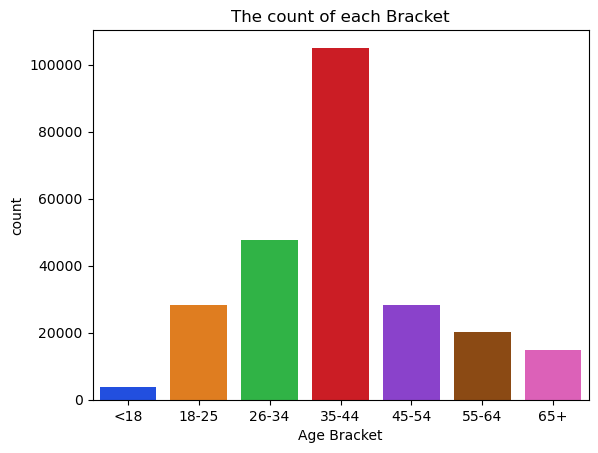

,DR_NO,Date Rptd,DATE OCC,AREA NAME,Crime Committed,Vict Age,Vict Sex,Weapon Desc,Status Desc,LOCATION,Victim Nationality,HOUR OCC,Age Bracket
0,221412410,2022-06-15,2020-11-12,Pacific,THEFT FROM MOTOR VEHICLE - PETTY ($950 & UNDER),40.108225,X,Unknown,Invest Cont,13600 MARINA POINT DR,Unknown,17,35-44
1,220314085,2022-07-22,2020-05-12,Southwest,THEFT OF IDENTITY,27.000000,F,Unknown,Invest Cont,2500 S SYCAMORE AV,Black,11,26-34
2,222013040,2022-08-06,2020-06-04,Olympic,THEFT OF IDENTITY,60.000000,M,Unknown,Invest Cont,3300 SAN MARINO ST,Hispanic/Latin/Mexican,16,55-64
3,220614831,2022-08-18,2020-08-17,Hollywood,THEFT OF IDENTITY,28.000000,M,Unknown,Invest Cont,1900 TRANSIENT,Hispanic/Latin/Mexican,12,26-34
4,231207725,2023-02-27,2020-01-27,77th Street,THEFT OF IDENTITY,37.000000,M,Unknown,Invest Cont,6200 4TH AV,Hispanic/Latin/Mexican,6,35-44


35-44    105012
26-34     47503
45-54     28353
18-25     28291
55-64     20169
65+       14747
<18        3913
Name: Age Bracket, dtype: int64


In [31]:
age_bins = [0, 17, 25, 34, 44, 54, 64, np.inf]
age_labels = ["<18", "18-25", "26-34", "35-44", "45-54", "55-64", "65+"]

# Add a new column using pd.cut() to bin values into discrete intervals
crimes["Age Bracket"] = pd.cut(crimes["Vict Age"],
                               bins=age_bins,
                               labels=age_labels)

# Find the category with the largest frequency
victim_ages = crimes["Age Bracket"].value_counts()
sns.countplot(data=crimes,x="Age Bracket",palette = "bright")
plt.title("The count of each Bracket")
plt.show()
display(crimes.head())
print(victim_ages)

- The 35-44 Bracket is the most bracket that has victims against whom cirmes have been committed.
- The <18 Bracket is the least bracket that has victims against whom crimes have been committed.

### 4. The age of each year by their gender : 

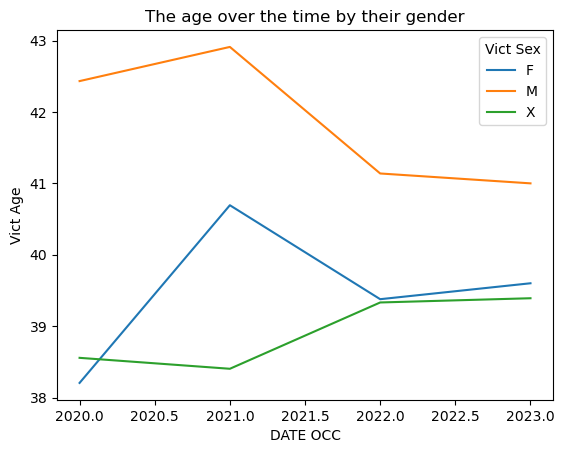

In [32]:
sns.lineplot(data=crimes,x= crimes["DATE OCC"].dt.year,y= crimes["Vict Age"],hue = "Vict Sex",errorbar=None)
plt.title("The age over the time by their gender")
plt.show()

- The Male gender is the largest gender that the crimes have been committed on it when they are between 35 and 45 years old. 
- The Female gender is the smallest gender that the crimes have been committed on it when they are between 30 and 40 years old.
- The Unknown gender that we couldn't recognize the gender of the victim.

### 5. Number of victims by their nationality by their gender :

In [33]:
fig = px.histogram(crimes,x= "Victim Nationality",color="Vict Sex",title="Number of victims by their nationality by their gender")
fig.show()
print(crimes["Victim Nationality"].value_counts())

Hispanic/Latin/Mexican            75350
Unknown                           58310
White                             48593
Black                             35307
Other                             19516
Other Asian                        5610
Korean                             1398
Filipino                           1232
Chinese                            1210
Japanese                            434
Vietnamese                          329
American Indian/Alaskan Native      322
Asian Indian                        145
Pacific Islander                     83
Hawaiian                             77
Cambodian                            21
Laotian                              20
Samoan                               17
Guamanian                            14
Name: Victim Nationality, dtype: int64


- we found that the most nationality that has victims is Hispanic/Latin/Mexican.
- And the least nationaliyt that has victims is Guamanian.

### 6. The ratio of victims for each gender :

M    101028
F     90804
X     56156
Name: Vict Sex, dtype: int64


Text(0.5, 1.0, 'Pie Chart')

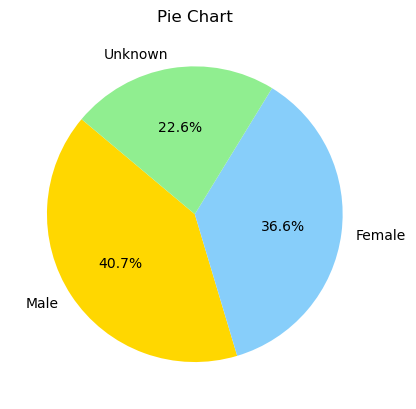

In [34]:
g = crimes["Vict Sex"].value_counts()
print(g)
# Creating a pie chart using Matplotlib
plt.pie( g, labels =["Male","Female","Unknown"] ,autopct='%1.1f%%', startangle=140, colors=['gold', 'lightskyblue', 'lightgreen'])

# Adding title
plt.title('Pie Chart')

# Display the plot
# plt.show()

- we found that the Male gender has the greatest ratio equal to 40.7%.
- But the Female gender has 36.6%.
- And 22.6% for the Unknown that we couldn't recognizethe gender of the victims.

### 7. The counts of each crime committed :

In [35]:
print (crimes["Crime Committed"].value_counts())

VEHICLE - STOLEN                            25797
THEFT OF IDENTITY                           23017
BATTERY - SIMPLE ASSAULT                    19970
BURGLARY                                    15163
BURGLARY FROM VEHICLE                       14280
                                            ...  
BIGAMY                                          1
INCITING A RIOT                                 1
GRAND THEFT / INSURANCE FRAUD                   1
FIREARMS RESTRAINING ORDER (FIREARMS RO)        1
DRUGS, TO A MINOR                               1
Name: Crime Committed, Length: 110, dtype: int64


- we noticed that the most crime committed is VEHICLE - STOLEN.
- And the least crime is BIGAMY, INCITING A RIOT, GRAND THEFT / INSURANCE FRAUD, FIREARMS RESTRAINING ORDER and DRUGS TO A MINOR.

## Conclusion 

#### - In this notebook:
1. We loaded the cirmes dataset and understand the Data.

2. We cleaned the datasets from the missing values.

3. Then explored crimes data and convert each column to the correct data type and give the columns the suitable name and drop the unnecessary columns.

4. We visualized which hour has the highest frequency of crimes, Identifying the area with the most night crime, Crimes by age group, The age of each year by their gender, Number of victims by their nationality by their gender, The ratio of victims for each gender and The counts of each crime committed.

5. We used the heatmap plot to see if there is any relation between the numerical columns but there isn't relation between them.

#### - Project Steps :
1. Understand the Data and ask questions that will be answered through this analysis.
2. Data Cleaning 
3. Exploratory Data Analysis.
4. Data Visualization.
6. Document Key insights.

### key insights :

- The Maximum crimes is 17065 and happened when the Hour is 12
- The Minimum crimes is 4440 and happened when the Hour is 5

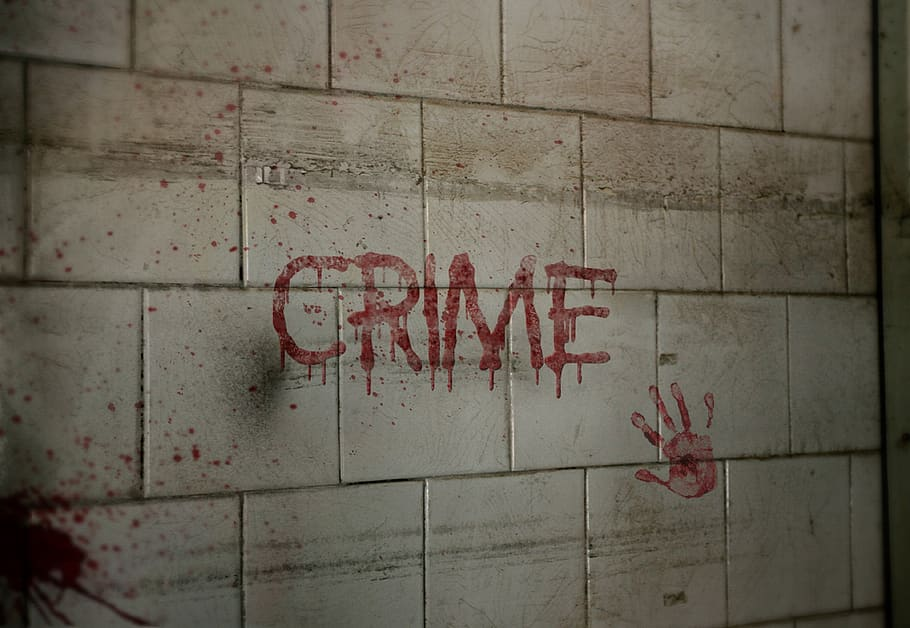

- The Area that has committed the maximum night crimes is Central
- The Area that has committed the minimum night crimes is Foothill

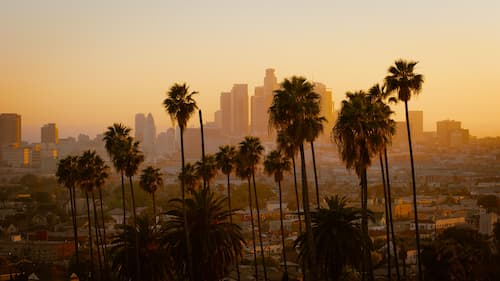

- The 35-44 Bracket is the most bracket that has victims against whom cirmes have been committed.
- The <18 Bracket is the least bracket that has victims against whom crimes have been committed.

- The Male gender is the largest gender that the crimes have been committed on it when they are between 35 and 45 years old. 
- The Female gender is the smallest gender that the crimes have been committed on it when they are between 30 and 40 years old.
- The Unknown gender that we couldn't recognize the gender of the victim.

- we found that the most nationality that has victims is Hispanic/Latin/Mexican.
- And the least nationaliyt that has victims is Guamanian.

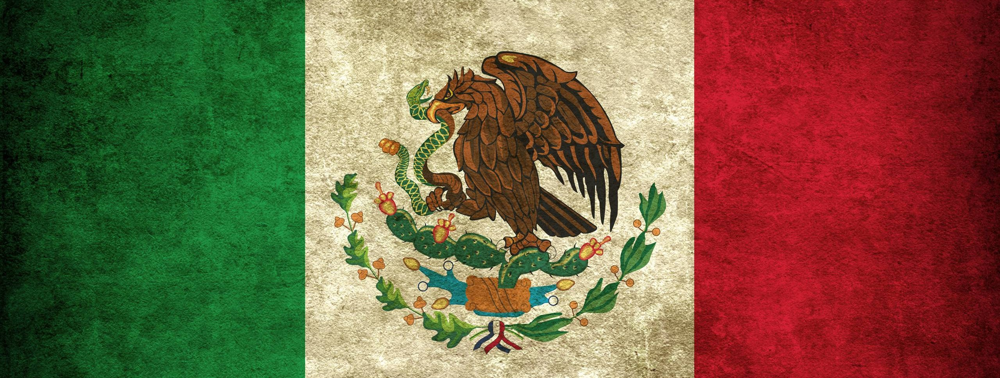

- we found that the Male gender has the greatest ratio equal to 40.7%.
- But the Female gender has 36.6%.
- And 22.6% for the Unknown that we couldn't recognizethe gender of the victims.

- we noticed that the most crime committed is VEHICLE - STOLEN.
- And the least crime is BIGAMY, INCITING A RIOT, GRAND THEFT / INSURANCE FRAUD, FIREARMS RESTRAINING ORDER and DRUGS, TO A MINOR.

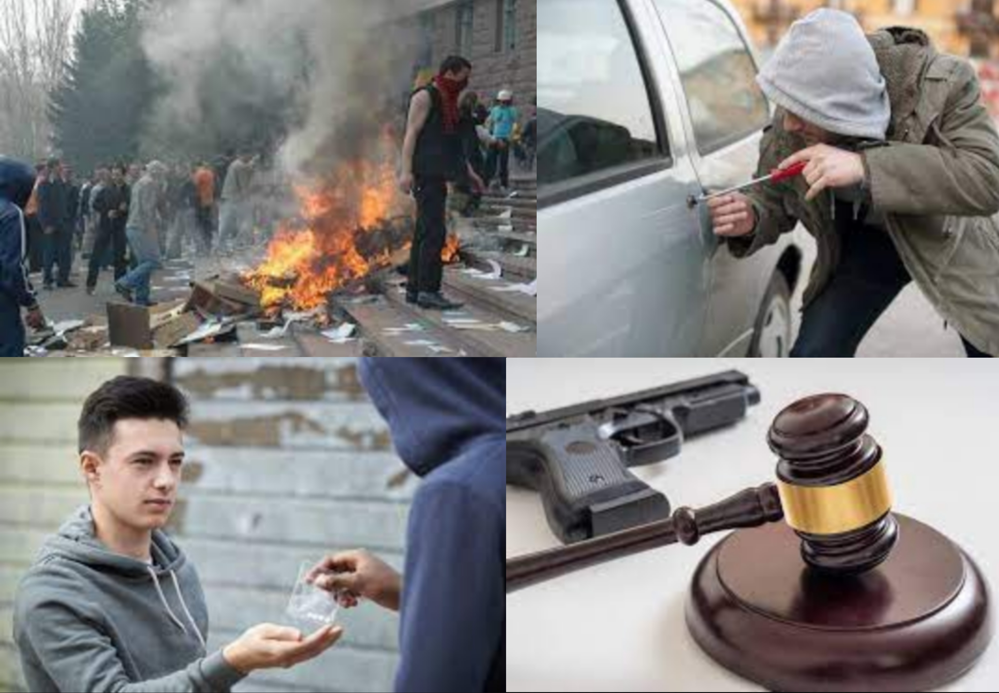